In [1]:
import anndata as ad

data = ad.read_h5ad("../data/imc_data.h5ad")

import spatialtis as st
import spatialtis.plotting as sp
from spatialtis import CONFIG

CONFIG.EXP_OBS = ["stage", "case", "part", "image"] 
CONFIG.CELL_TYPE_KEY = "cell_type" 
CONFIG.MARKER_KEY = "markers"
CONFIG.CENTROID_KEY = "centroid"

islets_cells = ['gamma', 'delta', 'alpha', 'beta']
group_order={"stage":["Non-diabetic", "Onset", "Long-duration"]}

In [2]:
def query_df(data, query):
    query_statement = []
    for k, v in query.items():
        if isinstance(v, str):
            query_statement.append(f"({k}=='{v}')")
        else:
            query_statement.append(f"({k}=={v})")
    return data.query("&".join(query_statement)).copy()

# Compare spatial distribution method

Finding distribution pattern ██████████ 100% 00:00|00:13


Finding distribution pattern ██████████ 100% 00:00|00:13


Finding distribution pattern ██████████ 100% 00:00|00:12


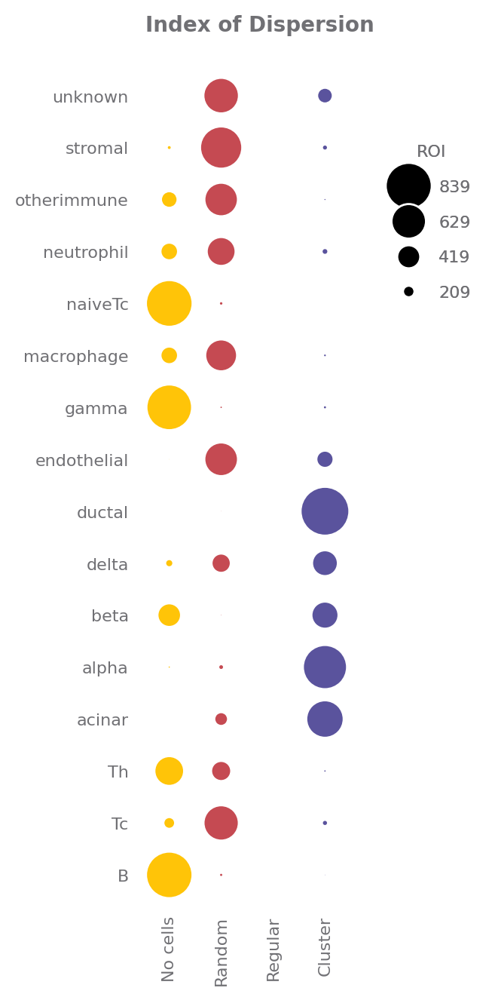

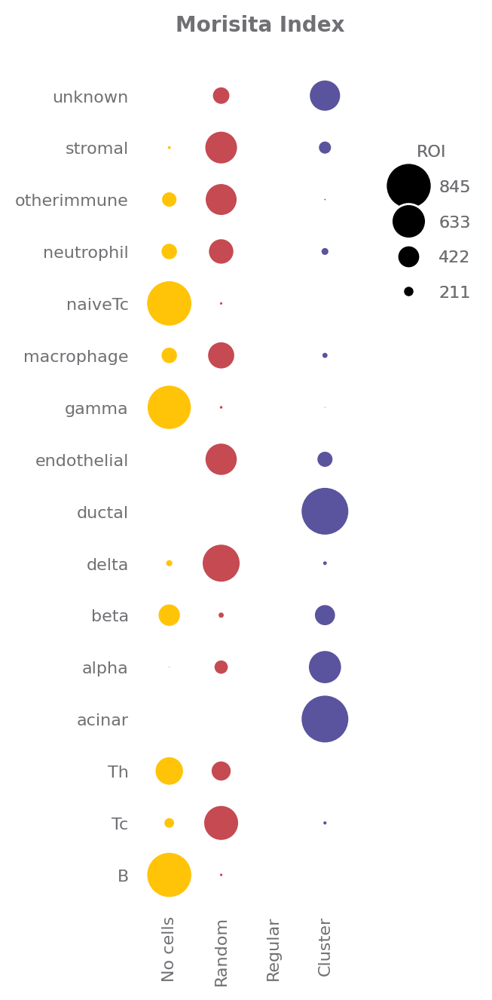

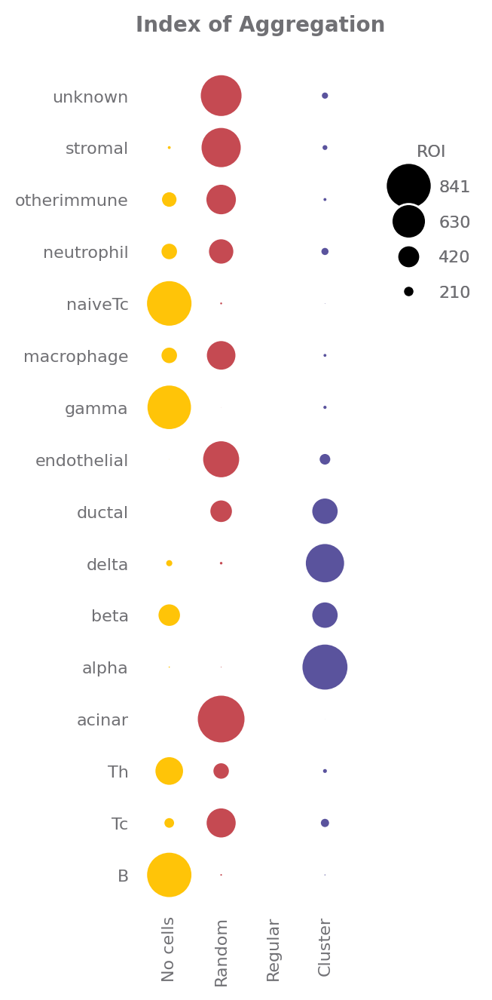

In [3]:
st.spatial_distribution(data, export_key="nns")
st.spatial_distribution(data, r=0.05, method="vmr", export_key="vmr")
st.spatial_distribution(data, quad=(8, 8), method="quad", export_key="quad")

sp.spatial_distribution(data, key="vmr", title="Index of Dispersion")
sp.spatial_distribution(data, key="quad", title="Morisita Index")
sp.spatial_distribution(data, key="nns", title="Index of Aggregation")

In [4]:
st.find_neighbors(data, expand=12)

Find neighbors ██████████ 100% 00:00|00:14


In [5]:
data.obs.cell_neighbors_count.mean()

4.681150089984434

In [6]:
st.neighborhood_analysis(data)

Neighborhood analysis ██████████ 100% 00:00|01:11


In [7]:
st

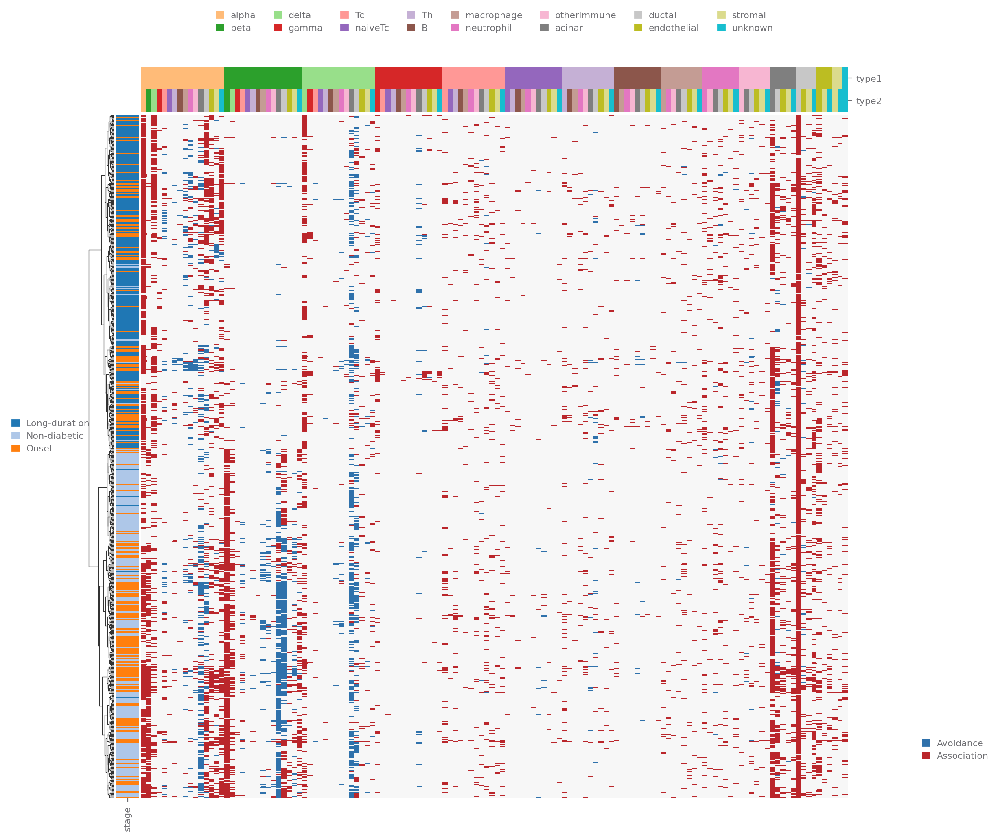

In [8]:
cell_type_order = ['alpha', 'beta', 'delta', 'gamma', 'Tc', 'naiveTc', 'Th', 'B', 'macrophage', 'neutrophil',
                  'otherimmune', 'acinar', 'ductal', 'endothelial', 'stromal', 'unknown']
sp.neighborhood_analysis(data, selected_types=cell_type_order, use="heatmap", 
                         clustermap_kwargs=dict(col_cluster=False, method="ward"))

In [9]:
st.cell_components(data)

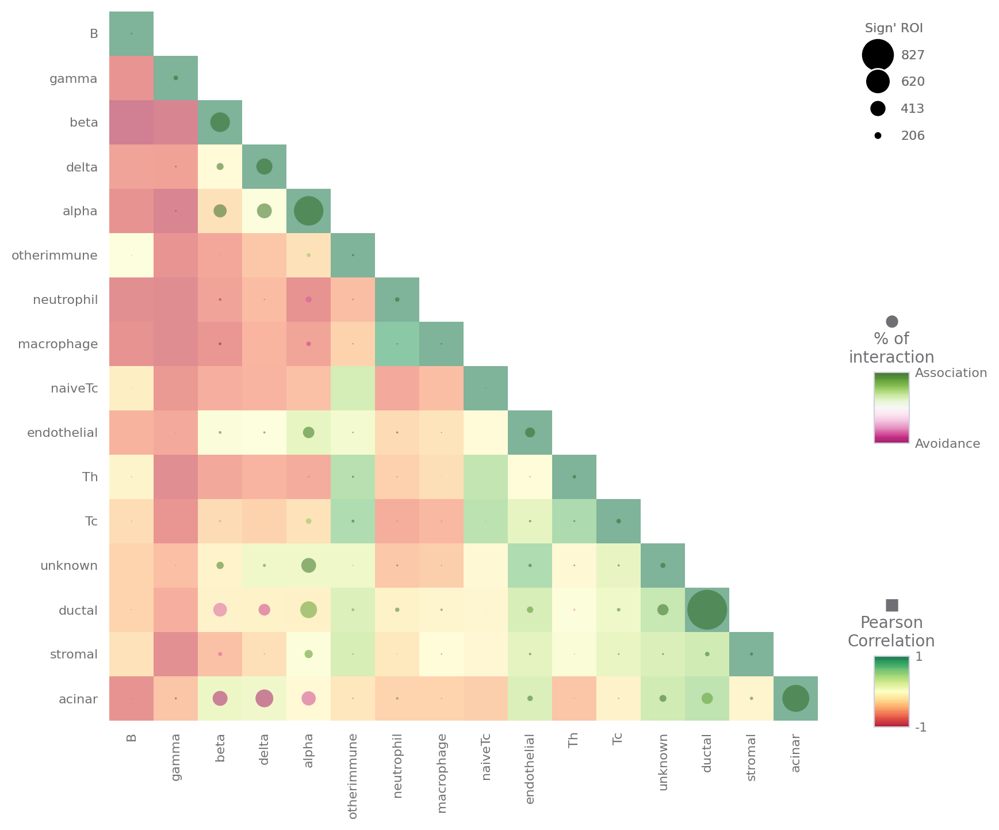

In [10]:
sp.neighborhood_analysis(data)

In [11]:
sp.neighborhood_analysis(data, use="graph_interactive").render()

KeyError: None

In [12]:
sp.neighbors_map(data, {"image": "A03"}, use="interactive", size=(800, 800)).render()

In [13]:
import matplotlib as mpl

In [14]:
mpl.rcParams['']

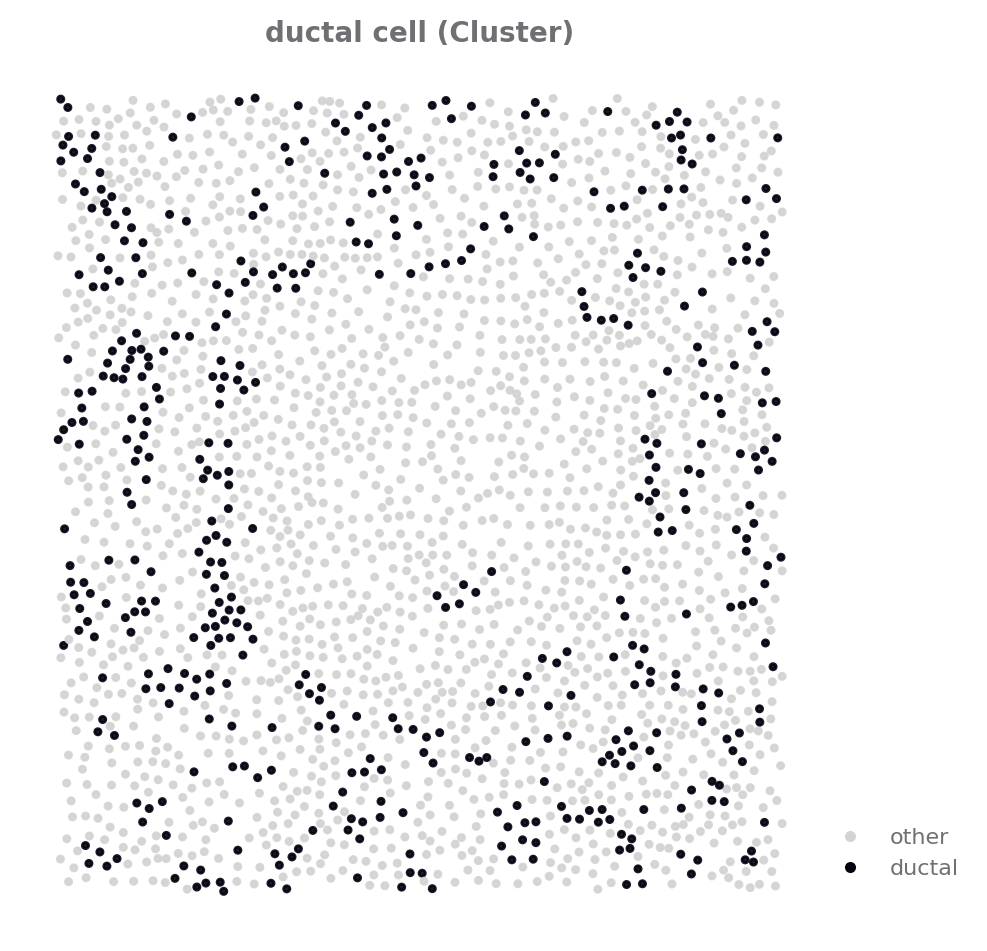

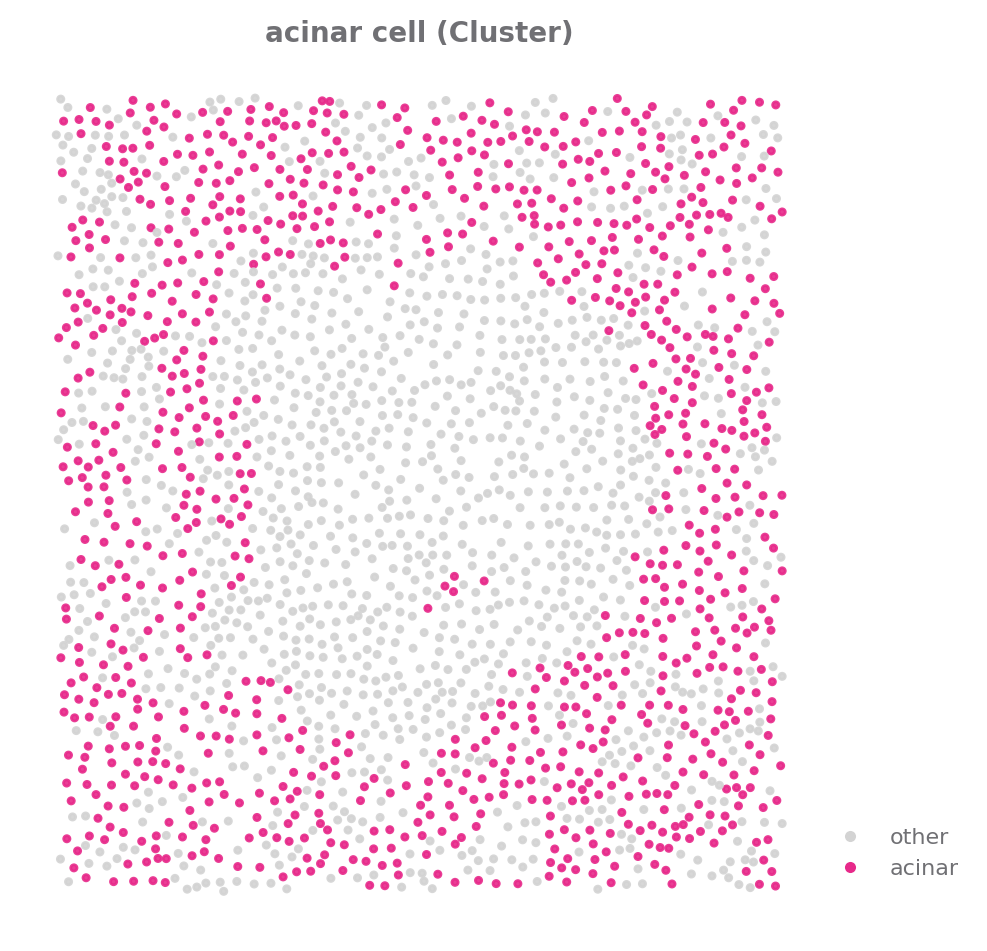

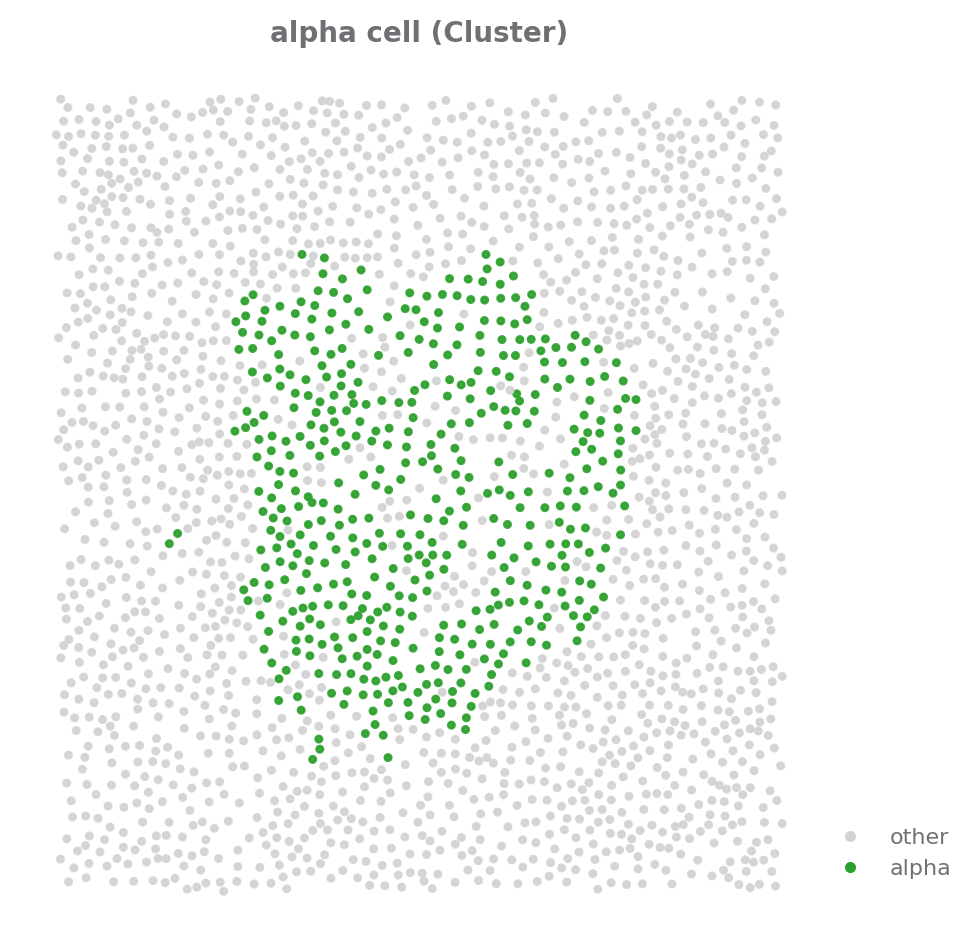

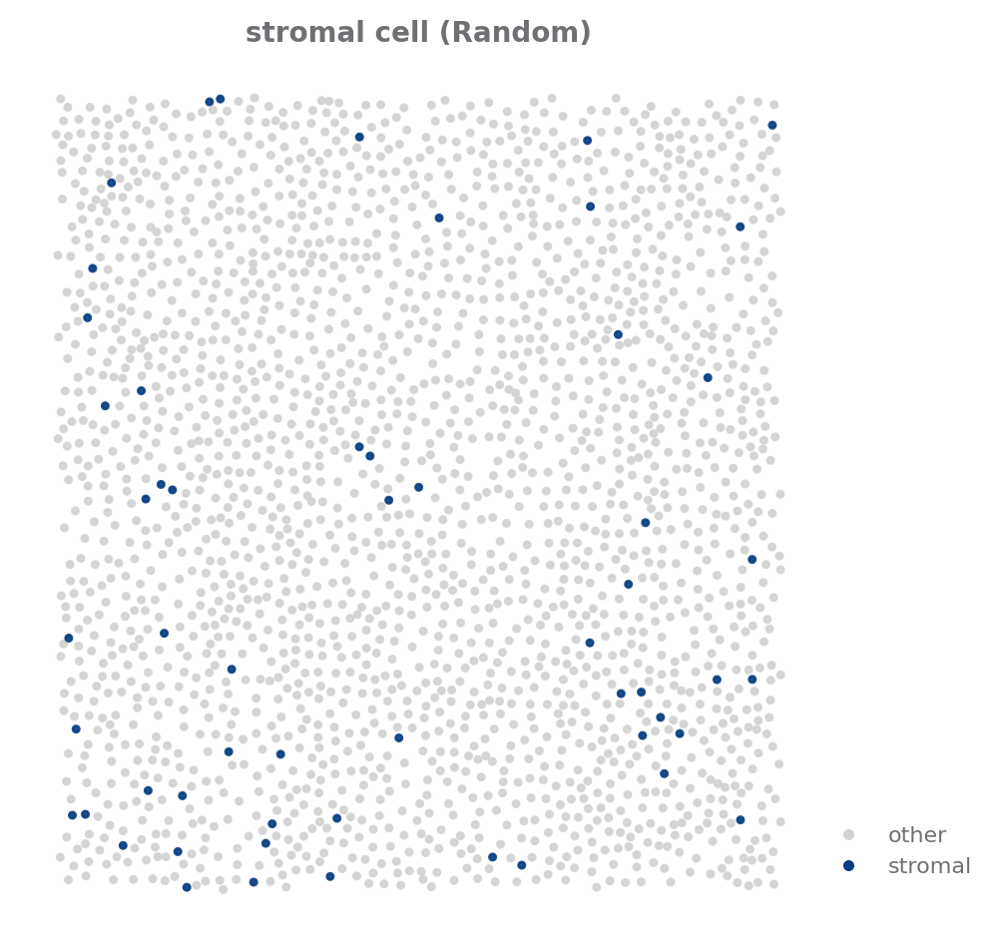

In [15]:

sp.cell_map(data, {"image": "A03"}, selected_types=['ductal'], title="ductal cell (Cluster)", palette="Magma")
sp.cell_map(data, {"image": "A03"}, selected_types=['acinar'], title="acinar cell (Cluster)", palette="Dark2")
sp.cell_map(data, {"image": "A03"}, selected_types=['alpha'], title="alpha cell (Cluster)", palette="Category20")
sp.cell_map(data, {"image": "A03"}, selected_types=['stromal'], title="stromal cell (Random)", palette="Blues")

In [16]:
def cell_map(ROI, cell):
    vmr = st.get_result(data, 'vmr')
    quad = st.get_result(data, 'quad')
    nns = st.get_result(data, 'nns')
    dfs = [vmr, quad, nns]
    pt = ['Index of Dispersion', 'Morisita Index', 'Index of Aggregation']
    title = []
    mapper = {0: "No cell", 1: "Random", 2: "Regular", 3: "Cluster"}
    for df, p in zip(dfs, pt):
        sdf = query_df(df, ROI)
        pattern = sdf[sdf['type'] == cell]['pattern'].values[0]
        title.append(f"{p}: {mapper[pattern]}")
        
    sp.cell_map(data, ROI, selected_types=[cell], title="\n".join(title))

In [17]:
cell_map({"image": "A03"}, 'stromal')

KeyError: 'vmr'

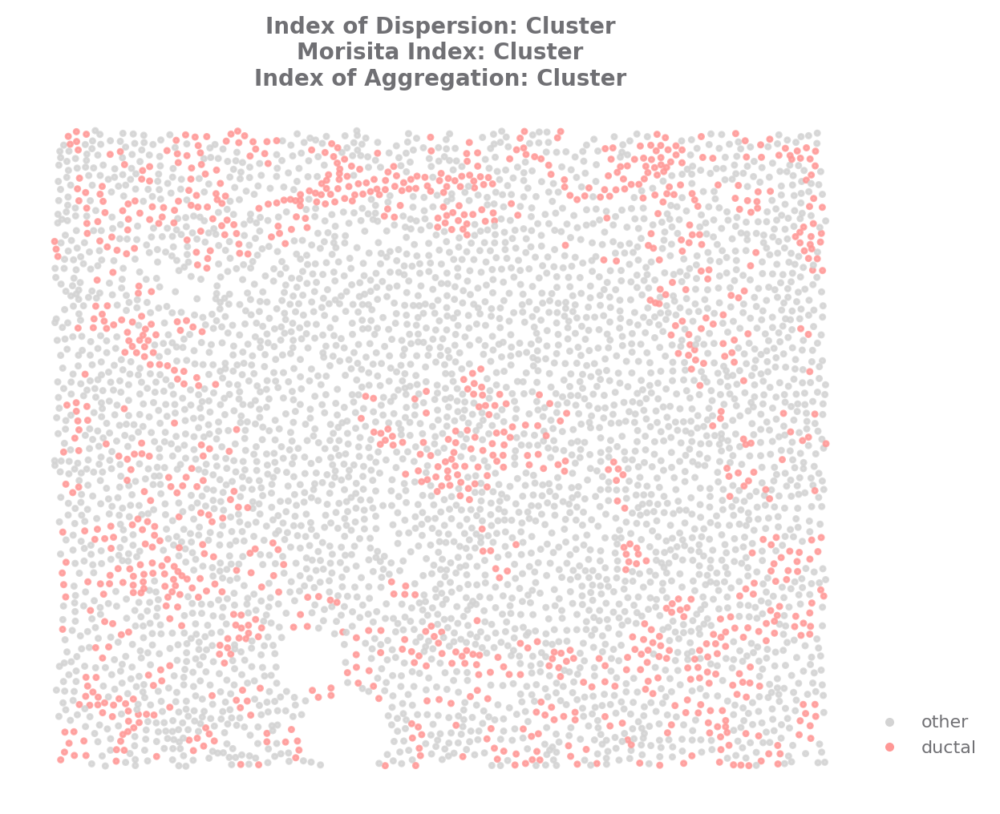

In [18]:
cell_map({"image": "A01"}, 'ductal')

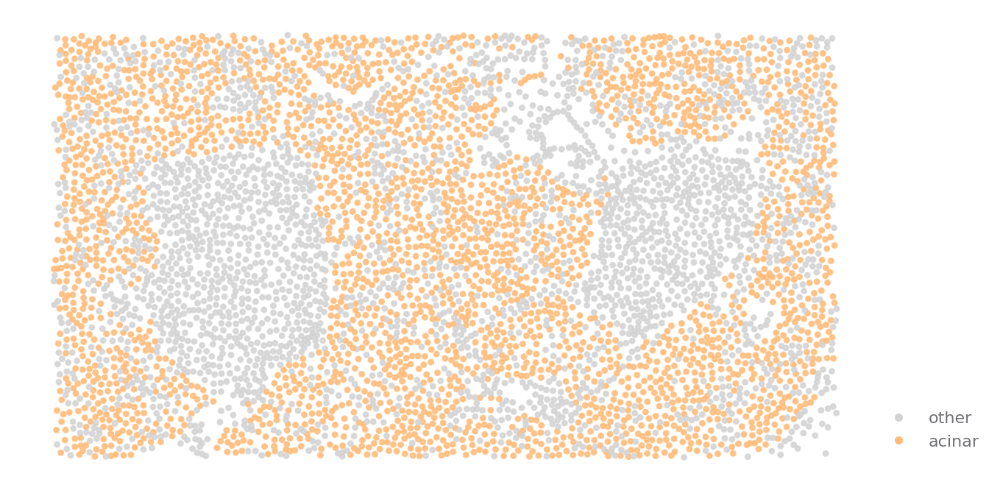

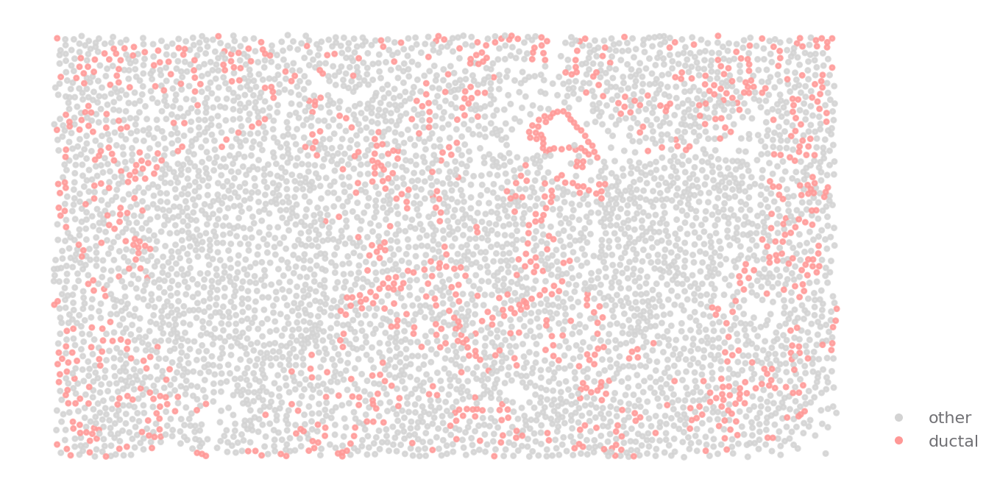

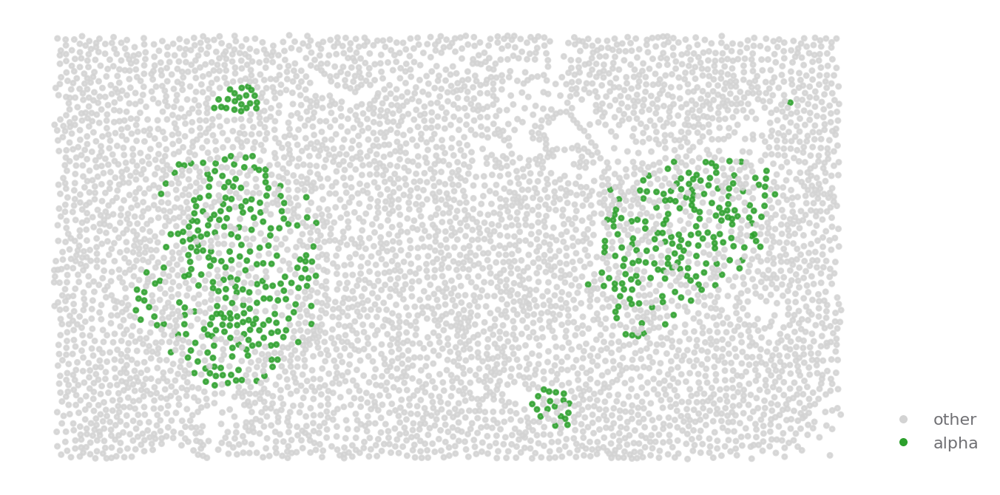

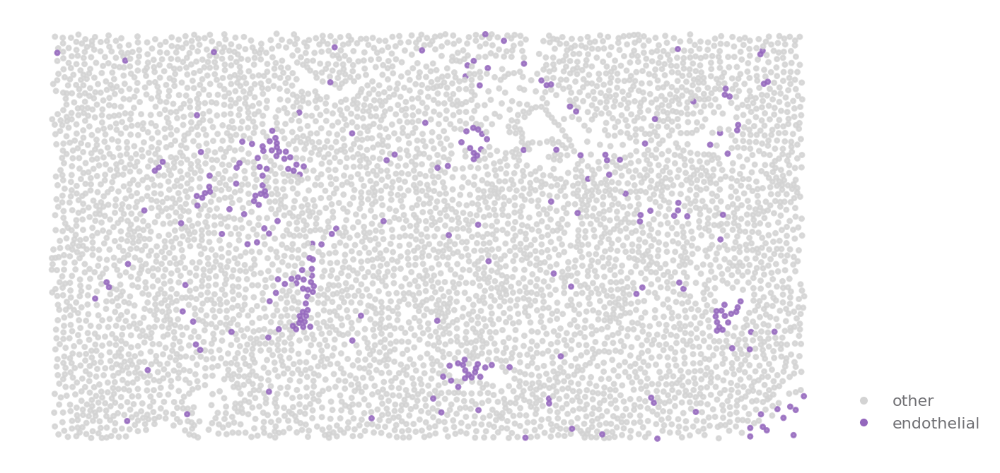

In [19]:
sp.cell_map(data, {"image":"G01"}, selected_types=['acinar'])
sp.cell_map(data, {"image":"G01"}, selected_types=['ductal'])
sp.cell_map(data, {"image":"G01"}, selected_types=['alpha'])
sp.cell_map(data, {"image":"G01"}, selected_types=['endothelial'])

In [20]:
from collections import Counter

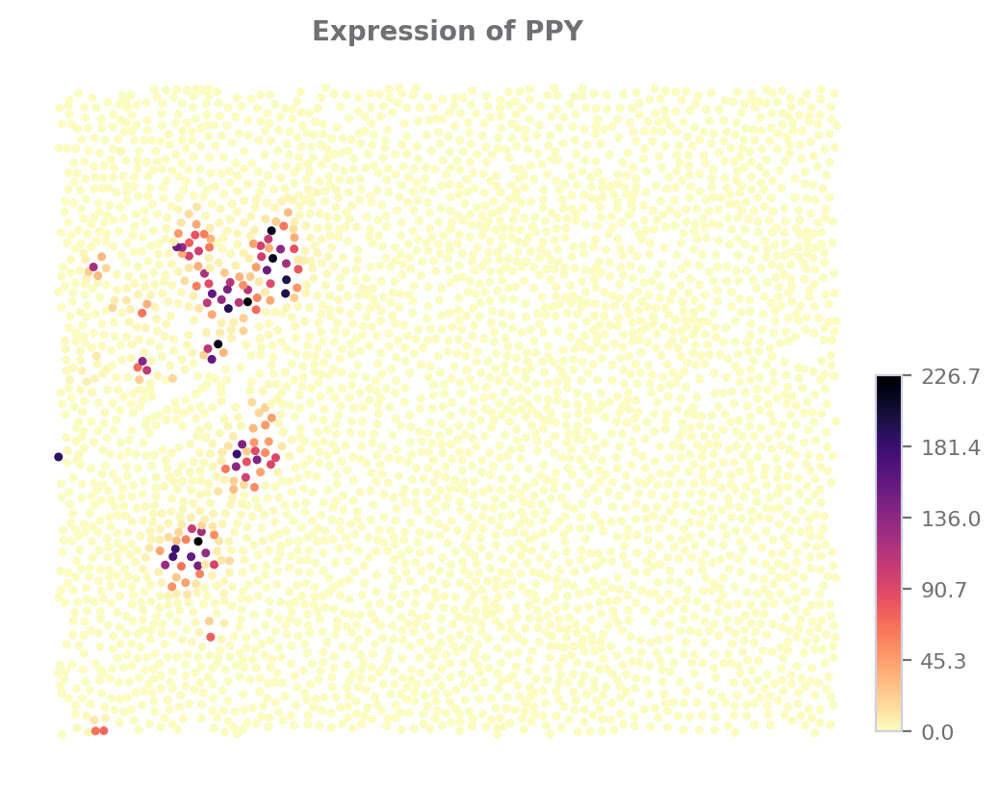

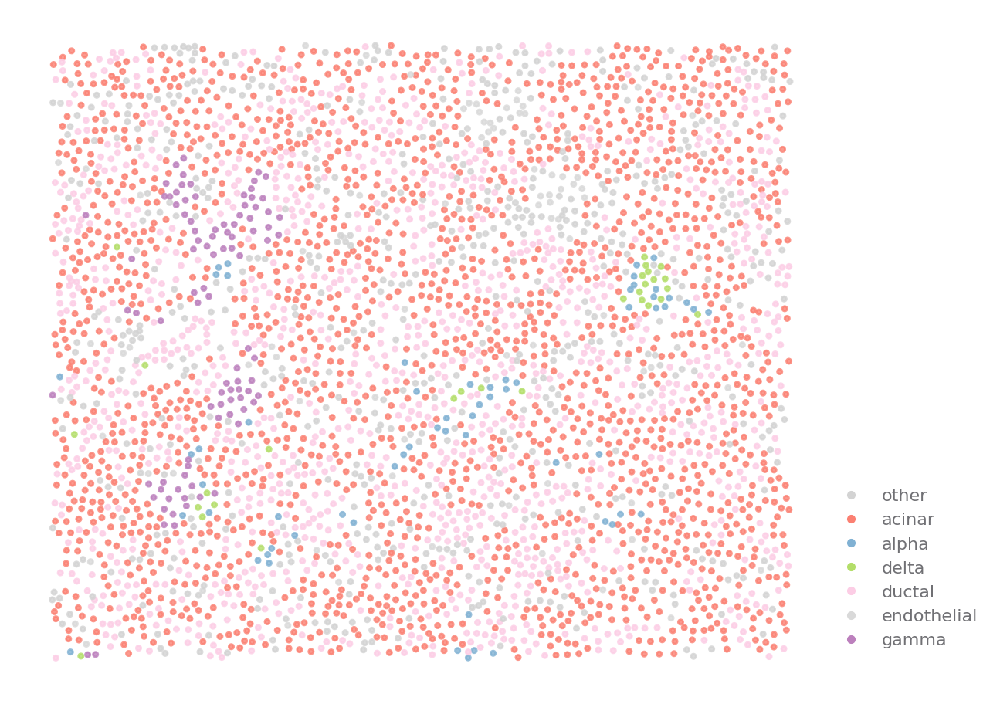

In [21]:
ROI = {"image": "A31"}
sp.expression_map(data, ROI, "PPY", title="Expression of PPY")
sp.cell_map(data, ROI, selected_types=['gamma', 'acinar', 'alpha', 'delta', 'ductal', 'endothelial'], palette="Set3")

In [22]:
sp.expression_map(data, ROI, "PPY", use="interactive").render()

In [23]:
naiveTc	PCSK2	endothelial	

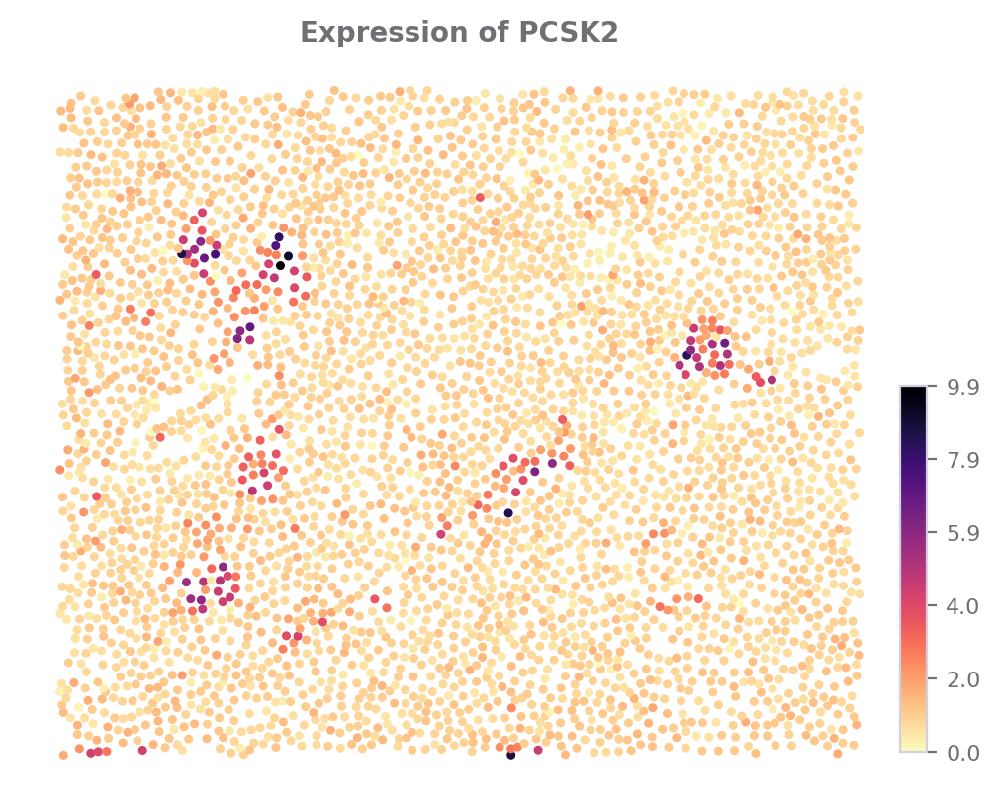

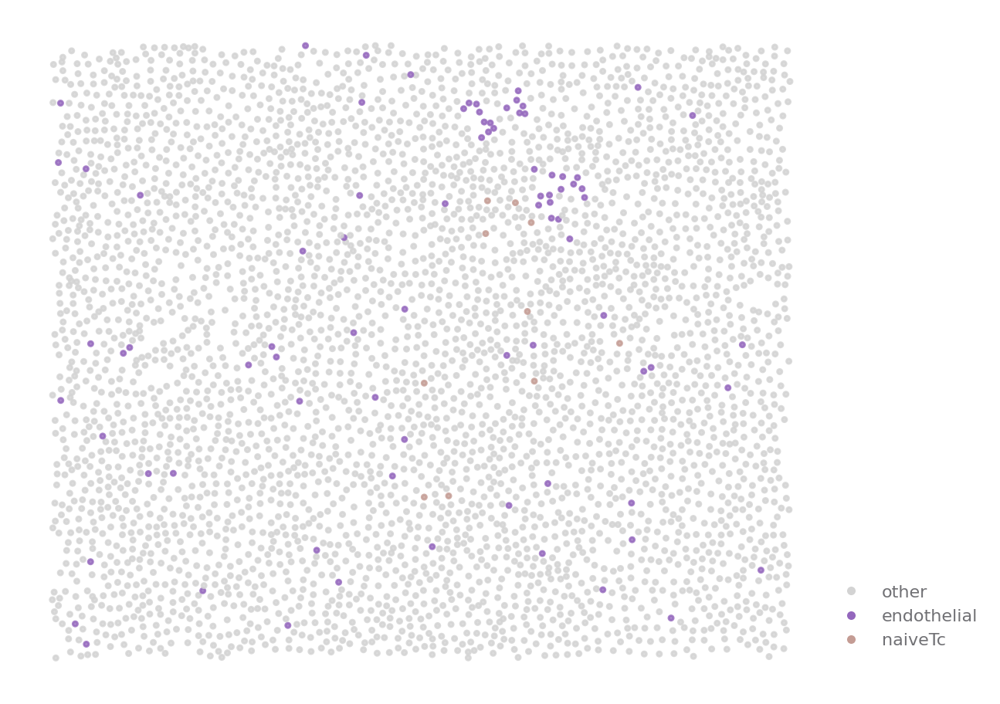

In [24]:
ROI = {"image": "A31"}
sp.expression_map(data, ROI, "PCSK2", title="Expression of PCSK2")
sp.cell_map(data, ROI, selected_types=['endothelial','naiveTc',], palette="Category20")